In [0]:
import os
import struct
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
#import tensorflow as tf
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.gridspec as gridspec



In [0]:
# Read MNIST Dataset
train=pd.read_csv("mnist_train.csv",header=None)

In [0]:
# Size of the dataset
train.shape


(60000, 785)

In [0]:
#Select the first 500 images
Train=np.copy(train.iloc[0:500,:])

In [0]:
# Subset the dataset (features and Labels)
X_train=Train[:,1:785]#.values
y_train=Train[:,0]#.values

In [0]:
#Size of Xtrain
X_train.shape

(500, 784)

In [0]:
y_train.shape


(500,)

In [0]:
def binarize_dataset(X):

  for i in range(0,X.shape[0]):
     for j in range(0,X.shape[1]):
              if(X[i,j]>127):
                   X[i,j]=1
              else:
                   X[i,j]=-1
  return X

In [0]:
X_Train=binarize_dataset(X_train)

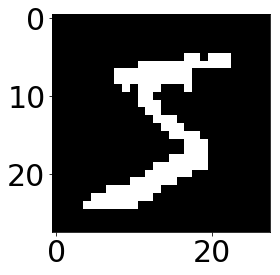

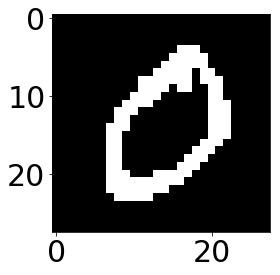

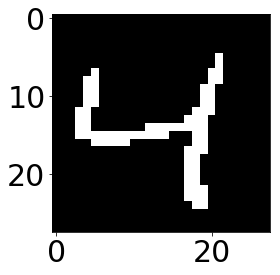

In [0]:


# Plot the Raw data

plt.figure()
plt.imshow(X_Train[0,:].reshape(28,28),cmap='gray')
plt.figure()
plt.imshow(X_Train[1,:].reshape(28,28),cmap='gray')
plt.figure()
plt.imshow(X_Train[2,:].reshape(28,28),cmap='gray')

In [0]:
#Create Noisy Data (Randomly)

X_train_noisy=np.copy(Train[:,1:785])#.values)
y_train_noisy=np.copy(Train[:,0])#.values)

In [0]:
for i in range(0,X_train.shape[0]):
    bits_to_flip = np.random.choice(784,15,replace=False)
    for j in range(len(bits_to_flip)):
       X_train_noisy[i,bits_to_flip[j]] = (X_train_noisy[i,bits_to_flip[j]])*-1

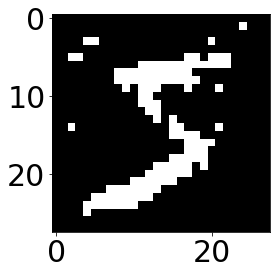

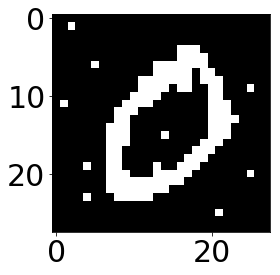

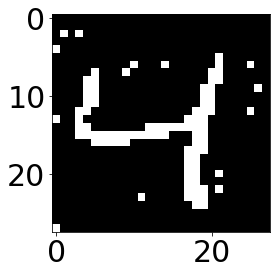

In [0]:
#Noisy Image 
plt.figure()
plt.imshow( X_train_noisy[0,:].reshape(28,28),cmap='gray')
plt.figure()
plt.imshow( X_train_noisy[1,:].reshape(28,28),cmap='gray')
plt.figure()
plt.imshow( X_train_noisy[2,:].reshape(28,28),cmap='gray')

In [0]:
# images to pics (28 * 28)

def pics(images):
   picture=[]
   for i in range(len(images)):
      picture.append(images[i].reshape(28,28))
   return picture
      
      

In [0]:
#TruE Images(28*28)
pic=np.array(pics(X_train))

#Noisy Images(28*28)
pic_noisy=np.array(pics(X_train_noisy))

In [0]:
#Denoising the image
def boltzman(pic,theta_H,theta_X):
  
  pi_output=[[] for k in range(500)]
  
  min_error=0.1
  
  for i in range(len(pic)):
      pi=np.ones((28,28))*0.5
      pi_prev=np.ones((28,28))*0.5
      
      for l in range(30):
              for j in range(pic[i].shape[0]):
                  for k in range(pic[i].shape[0]):
                        z=0
                        if(j>0):
                            
                            z=z+((theta_H)*((2*pi_prev[j-1,k])-1)) #+(pic[i,j-1,k]*(theta_X))

                        if(j<27):
                            
                            z=z+((theta_H)*((2*pi_prev[j+1,k])-1)) #+(pic[i,j+1,k]*(theta_X))

                        if(k>0):
                            
                            z=z+((theta_H)*((2*pi_prev[j,k-1])-1)) #+(pic[i,j,k-1]*(theta_X))

                        if(k<27):
                            
                            z=z+((theta_H)*((2*pi_prev[j,k+1])-1)) #+(pic[i,j,k+1]*(theta_X))
                            
                        z=z+(pic[i,j,k]*(theta_X))

                        pi[j,k]=(np.exp(z))/((np.exp(z)+np.exp(-z)))

              #error=np.absolute(np.sum(pi_prev-pi))    

              #if error < min_error:
                 # pi_output[i]=pi
               #   break
                  
              #else:
              pi_prev=np.copy(pi)
      pi_output[i]=pi


  
  return pi_output

In [0]:
#output->Boltzman
def result(pi_updated):
     
  for i in range(500):
     for j in range(28):
        for k in range(28):
              if(pi_updated[i,j,k]>0.5):
                  pi[i,j,k]=1
                
              else:
                  pi_updated[i,j,k]=-1
  return pi

In [0]:
pi=np.array(boltzman(pic_noisy,0.2,0.2))

d
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
f
d
e
c
d
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
c
d
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
c
d
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
c
d
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c
d
e
f
c


In [0]:
#Denoised Images
denoised_images=np.array(result(pi))

In [0]:
#Report the fraction of all pixels that are correct in the 500 images.
print("The accuracy between true images and denoised image :",(np.sum(pic==denoised_images)/(784*500))*100,"%")

The accuracy between true images and denoised image : 99.47933673469387 %


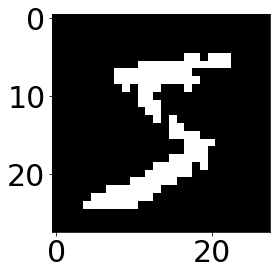

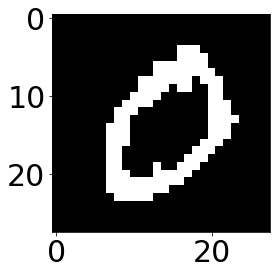

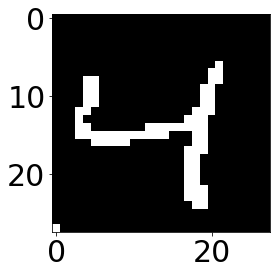

In [0]:
#Denoised Images
plt.figure()
plt.imshow(denoised_images[0,:,:],cmap='gray')
plt.figure()
plt.imshow(denoised_images[1,:,:],cmap='gray')
plt.figure()
plt.imshow(denoised_images[2,:,:],cmap='gray')

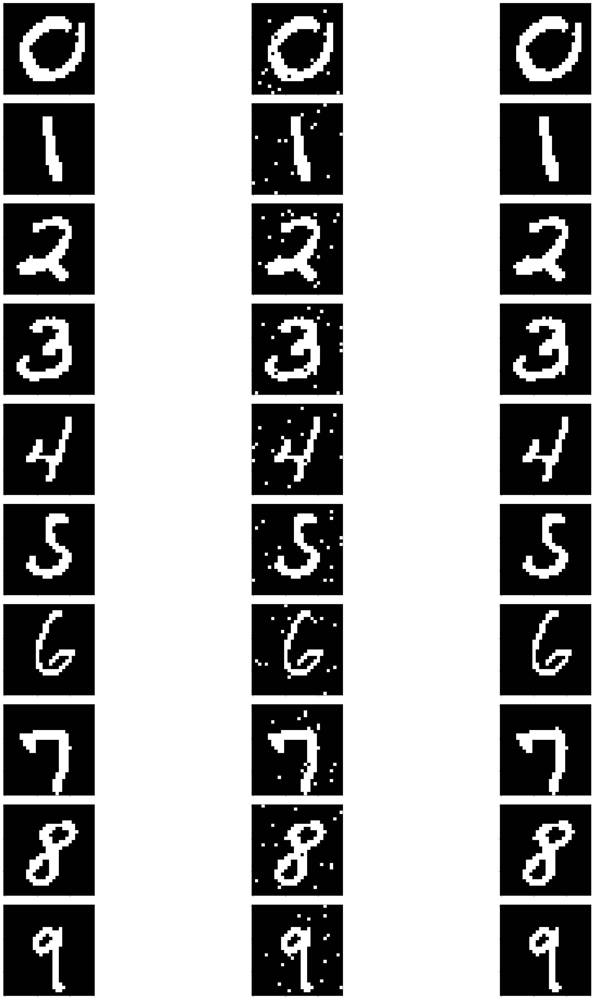

In [0]:
z=[]


for i in [0,1,2,3,4,5,6,7,8,9]:
        maxi=-112
        for j in range(len(pic)):

            if(y_train[j]==i):

                if (np.sum(pic[j,:,:]==denoised_images[j,:,:]))>maxi:
                    maxi=np.sum(pic[j,:,:]==denoised_images[j,:,:])
                    k=j

        z.append((pic[k,:,:],pic_noisy[k,:,:],denoised_images[k,:,:]))
        

m=[]
for i in range(len(z)):
    for j in range(len(z[i])):
         m.append(z[i][j])

            
            


plt.figure(figsize = (50,50))
gs1 = gridspec.GridSpec(10,3)
gs1.update(wspace=0.0, hspace=0.1, top=0.95, bottom=0.05, left=0.17, right=0.845) # set the spacing between axes. 

for i in range(30):
    #i = i + 1 
    ax1 = plt.subplot(gs1[i])
    plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    plt.imshow(m[i],cmap='gray')
    #plt.subp

plt.show()




 
           














In [0]:
len(y_train)

500

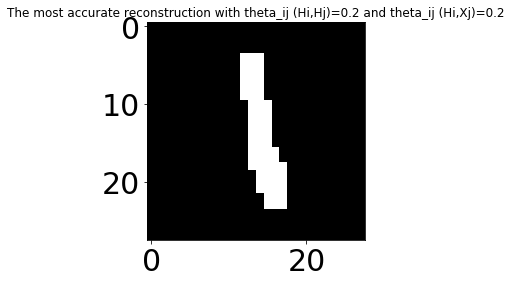

In [0]:
#most accurate reconstruction
k=0
max=-112
for i in range(500):
    
    
    if (np.sum(pic[i,:,:]==denoised_images[i,:,:]))>max:
               max=np.sum(pic[i,:,:]==denoised_images[i,:,:])
               k=i
        
        
        
plt.figure()
plt.title("The most accurate reconstruction with theta_ij (Hi,Hj)=0.2 and theta_ij (Hi,Xj)=0.2")
plt.imshow(denoised_images[k,:,:],cmap='gray')
    
    

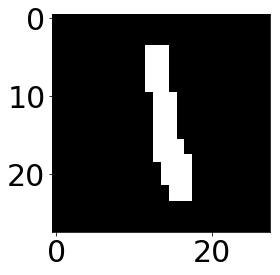

In [0]:
#True Image

plt.figure()
plt.imshow(pic[k,:,:],cmap='gray')


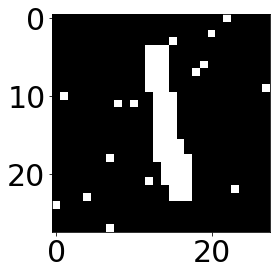

In [0]:
#The noisy Image

plt.figure()
plt.imshow( X_train_noisy[k,:].reshape(28,28),cmap='gray')


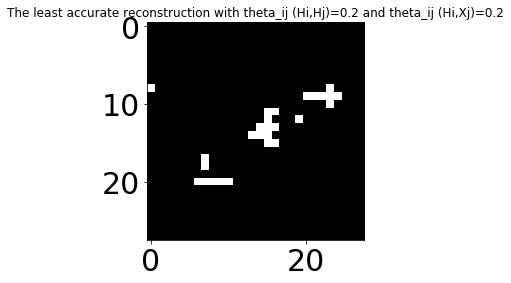

In [0]:
# The least accurate reconstruction
k=0
min=22222
for i in range(500):
    
    if (np.sum(pic[i,:,:]==denoised_images[i,:,:]))<min:
               min=np.sum(pic[i,:,:]==denoised_images[i,:,:])
               k=i
        
        
plt.figure()
plt.title("The least accurate reconstruction with theta_ij (Hi,Hj)=0.2 and theta_ij (Hi,Xj)=0.2")

plt.imshow(denoised_images[k,:,:],cmap='gray')


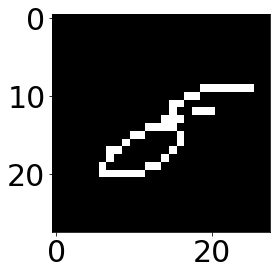

In [0]:
#True Image
plt.figure()
plt.imshow(pic[k,:,:],cmap='gray')


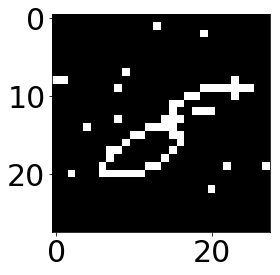

In [0]:
#Noisy Image
plt.figure()
plt.imshow( X_train_noisy[k,:].reshape(28,28),cmap='gray')


In [0]:
#ROC Curve

# theta_ij (Hi,Hj)(Xi,Xj)[(-1,0.2),(0,0.2),(0.2,0.2),(1,0.2),(2,0.2)]

R_P=[]
R_F=[]
  
for theta in [(-1,0.2),(0,0.2),(0.2,0.2),(1,0.2),(2,0.2)]:
  tp=0
  fp=0
  labels=[] 
  TPR=np.sum(pic==1)
  FPR=np.sum(pic==-1)
  pi=np.array(boltzman(pic_noisy,theta[0],theta[1]))
  denoised_images=np.array(result(pi))
  for i in range(500):
  
    for j in range(28):
       for k in range(28):
          if(denoised_images[i,j,k]==1 and pic[i,j,k]==1):
              tp=tp+1
          elif(denoised_images[i,j,k]==1 and pic[i,j,k]==-1):
              fp=fp+1
  
  
  R_P.append(tp/TPR)
  print("True Positive",tp)
  R_F.append(fp/FPR)
  print("False Positive",fp)


True Positive 35987
False Positive 335652
True Positive 49017
False Positive 6597
True Positive 48790
False Positive 911
True Positive 25177
False Positive 4657
True Positive 27797
False Positive 3938


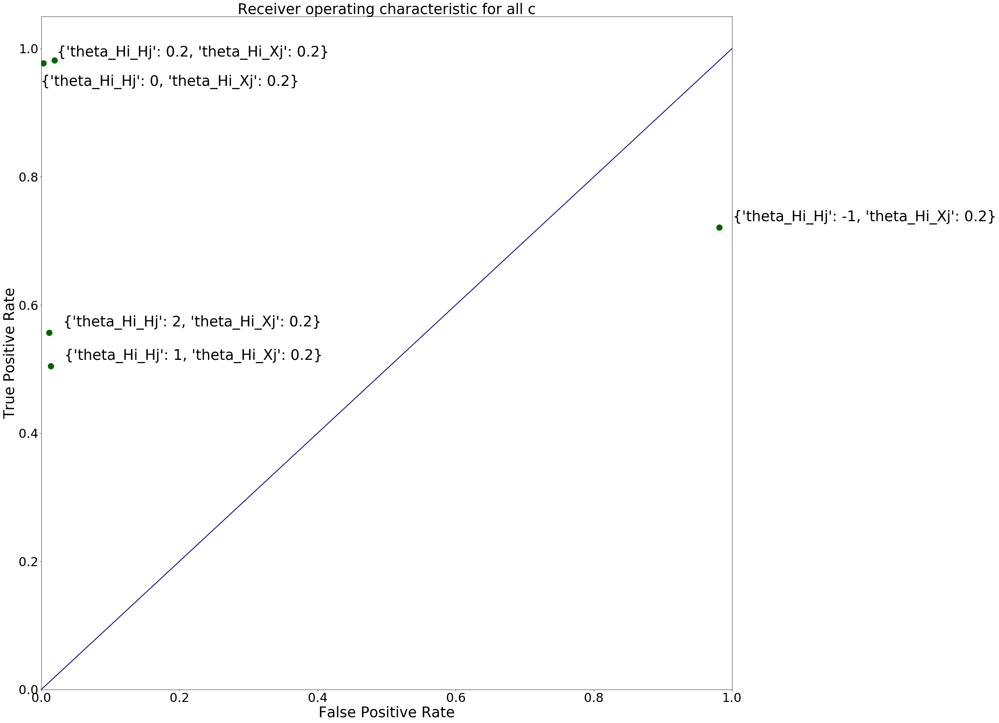

In [0]:
plt.figure()
lw = 2
plt.rcParams['figure.figsize'] = [30,30]
types = [{"theta_Hi_Hj":-1,"theta_Hi_Xj":0.2},{"theta_Hi_Hj":0,"theta_Hi_Xj":0.2},{"theta_Hi_Hj":0.2,"theta_Hi_Xj":0.2},{"theta_Hi_Hj":1,"theta_Hi_Xj":0.2},{"theta_Hi_Hj":2,"theta_Hi_Xj":0.2}]
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='-')
plt.scatter(R_F,R_P, color='darkgreen',s=200)
plt.rc('xtick', labelsize=30) 
plt.rc('ytick', labelsize=30) 
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate',fontsize=35)
plt.ylabel('True Positive Rate',fontsize=35)
plt.title('Receiver operating characteristic for all c',fontsize=35)

for i in range(len(R_P)):
     if i==1:
        plt.text(R_F[i]-0.02, R_P[i]-0.04, types[i], fontsize=35)
        continue
     plt.text(R_F[i]+0.02, R_P[i]+0.01, types[i], fontsize=35)




        


plt.show()

In [0]:
print(R_P)

In [0]:
print(R_F)

In [0]:
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.4)
z=[]


for i in [0,1,2,3,4,5,6,7,8,9]:
        maxi=-112
        for j in range(len(pic)):

            if(y_train[j]==i):

                if (np.sum(pic[j,:,:]==denoised_images[j,:,:]))>maxi:
                    maxi=np.sum(pic[j,:,:]==denoised_images[j,:,:])
                    k=j

        z.append((pic[k,:,:],pic_noisy[k,:,:],denoised_images[k,:,:]))
        #plt.imshow(denoised_images[k,:,:],cmap='gray')
        #plt.imshow(pic_noisy[k,:,:],cmap='gray')
        #plt.imshow(pic[k,:,:],cmap='gray')




